# Experiment 1

# Table of Contents
1. [Libraries and Import data](#data)<br>
2. [Changing the network](#change)<br>
3. [Pre - Experiment 1](#pre1)<br>
4. [Post - Experiment 1](#post1)<br>


# 1. Libraries and Import Data <a name="data"></a>

In [1]:
# !pip install pyarrow
# !pip install fastparquet

In [2]:
import killing_agents as ka
import networkx as nx
import pickle
from geopy import distance
import pandas as pd
import numpy as np
from collections import defaultdict
import matplotlib.pyplot as plt
import math, copy
from functools import reduce
import copy
import resurrecting_agents as ra

In [3]:
G = nx.read_gpickle("data/G.gpickle")

In [4]:
percorsi_metro = pd.read_csv('data/tpl_metropercorsi.csv', sep = ';')

In [5]:
# # auxiliary function to print dataframes side by side
# from IPython.display import display_html
# from itertools import chain,cycle
# def display_side_by_side(*args,titles=cycle([''])):
#     html_str=''
#     for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
#         html_str+='<th style="text-align:center"><td style="vertical-align:top">'
#         html_str+=f'<h2>{title}</h2>'
#         html_str+=df.to_html().replace('table','table style="display:inline"')
#         html_str+='</td></th>'
#     display_html(html_str,raw=True)

In [6]:
# def plot_graph(G, coords, figsize = (20,20), dpi = 500):
#     """
#     Plots graph
#     """
#     colors = {1: 'red', 2: 'green', 3: 'yellow', 4: 'blue', 5: 'violet', 'TRAM': 'brown', 'BUS': 'pink', 'FILOBUS': 'grey'}
#     plt.figure(figsize=figsize, dpi=dpi)
#     color_comp = nx.get_edge_attributes(G,'color').values()
#     nx.draw_networkx(G, pos = coords, with_labels=False, node_size=1,edge_color=color_comp, arrowsize = 4, label = colors)
#     plt.legend()

# 2. Changing the network<a name="change"></a>

In [7]:
G_ex1 = copy.deepcopy(G)

In [8]:
duomo_stops = ka.fermate[ka.fermate.nome.isin(['DUOMO M1', 'DUOMO M3', 'MISSORI', 'MONTENAPOLEONE', 'CORDUSIO', 'SAN BABILA'])]
duomo_stops_id = duomo_stops.id_amat.unique()
duomo_stops

,id_amat,nome
20,909,SAN BABILA
44,933,MONTENAPOLEONE
46,935,MISSORI
69,959,DUOMO M3
70,960,DUOMO M1
77,967,CORDUSIO


In [9]:
duomo_edges = [(960, 967, 'METRO1'), (967, 960, 'METRO1'), (960, 909, 'METRO1'), (909, 960, 'METRO1'),
               (959, 935, 'METRO3'), (935, 959, 'METRO3'), (959, 933, 'METRO3'), (933, 959, 'METRO3')]

In [10]:
edges = [(909, 967, 'METRO1'), (967, 909, 'METRO1'), (933, 935, 'METRO3'), (935, 933, 'METRO3')]
colors = {'METRO1': 'red', 'METRO3': 'yellow'}

# new_duomo_edges = []
# for i in edges:
new_duomo_edges = [(i[0],i[1],i[2], {'weight':distance.distance(ka.coords[i[0]], ka.coords[i[1]]).km/32,'trans_mode':int(i[2][-1]), 'color': colors[i[2]], 
                       'lines': i[2], 'waiting_list':[], 'passengers_list':[], 'total_capacity':40}) for i in edges]


In [11]:
G_ex1.remove_edges_from(duomo_edges)

In [12]:
G_ex1.add_edges_from(new_duomo_edges)

['METRO1', 'METRO1', 'METRO3', 'METRO3']

In [13]:
d_active_edges_ex1 = ka.d_active_edges.copy()

In [14]:
d_active_edges_ex1[(909, 967, 'METRO1')] = d_active_edges_ex1[(909, 960, 'METRO1')]
d_active_edges_ex1[(967, 909, 'METRO1')] = d_active_edges_ex1[(967, 960, 'METRO1')]
d_active_edges_ex1[(935, 933, 'METRO3')] = d_active_edges_ex1[(935, 959, 'METRO3')]
d_active_edges_ex1[(933, 935, 'METRO3')] = d_active_edges_ex1[(933, 959, 'METRO3')]

In [15]:
ka.fermate[ka.fermate.nome.isin(['MISSORI', 'MONTENAPOLEONE', 'CORDUSIO', 'SAN BABILA', 'CROCETTA', 'TURATI', 'CAIROLI', 'PALESTRO'])]

,id_amat,nome
10,899,TURATI
20,909,SAN BABILA
40,929,PALESTRO
44,933,MONTENAPOLEONE
46,935,MISSORI
74,964,CROCETTA
77,967,CORDUSIO
91,981,CAIROLI


In [16]:
# edges metro 3
G_ex1[964][935]['METRO3']['next_edges'] = [(935, 933, 'METRO3')] # crocetta-missori --> missori-montenapoleone
G_ex1[935][933]['METRO3']['next_edges'] = [(933, 899, 'METRO3')] # missori-montenapoleone --> montenapoleone-turati
G_ex1[899][933]['METRO3']['next_edges'] = [(933, 935, 'METRO3')] # turati-montenapoleone --> montenapoleone-missori
G_ex1[933][935]['METRO3']['next_edges'] = [(935, 964, 'METRO3')] # montenapoleone-missori --> missori-crocetta

# edges metro 1
G_ex1[981][967]['METRO1']['next_edges'] = [(967, 909, 'METRO1')] # cairoli-cordusio --> cordusio-sanbabila
G_ex1[967][909]['METRO1']['next_edges'] = [(909, 929, 'METRO1')] # cordusio-sanbabila --> sanbabila-palestro
G_ex1[929][909]['METRO1']['next_edges'] = [(909, 967, 'METRO1')] # palestro-sanbabila --> sanbabila-cordusio
G_ex1[909][967]['METRO1']['next_edges'] = [(967, 981, 'METRO1')] # sanbabila-cordusio --> cordusio-cairoli

In [17]:
perc_1 = percorsi_metro[percorsi_metro.linea.isin([1])].percorso.unique()
perc_3 = percorsi_metro[percorsi_metro.linea.isin([3])].percorso.unique()

In [18]:
percorsi_ex1 = ka.percorsi.copy()

In [19]:
for i in perc_1:
    percorsi_ex1[i] = list(set(percorsi_ex1[i]).difference(set(duomo_edges)).union(set([(909, 967, 'METRO1'),(967, 909, 'METRO1')])))

for i in perc_3:
    percorsi_ex1[i] = list(set(percorsi_ex1[i]).difference(set(duomo_edges)).union(set([(933, 935, 'METRO3'),(935, 933, 'METRO3')])))

In [19]:
#nx.write_gpickle(G_ex1, "data/G_ex1.gpickle")

# 3. Pre - experiment 1<a name="pre1"></a>

Generating the agent objects, takes roughly 30 hours!

In [20]:
# generating 10 schedules for 25000 agents each
# for i in range(1,11):
#     dic, df = ka.gen_agent(25000)
#     file = open(f"pickle_ag/schedule_{i}.pkl", "wb")
#     pickle.dump(dic, file)
#     file.close()

In [21]:
# generating 10 agents objects for 25000 agents each (takes more than 30 hours)
# for i in range(1,11):
#     file = open(f"pickle_ag/schedule_{i}.pkl", "rb")
#     schedule = pickle.load(file)
#     file.close()
#     agents_obj = ka.gen_agents_objects(schedule, ka.percorsi, ka.foot, ka.orari, G)
#     file = open(f"pickle_ag/schedule_{i}_object.pkl", "wb")
#     pickle.dump(agents_obj, file)
#     file.close()

In [20]:
# Importing agents objects pre- experiment 1
list_of_objects = []
for i in range(1,11):
    file = open(f'pickle_ag/schedule_{i}_object.pkl', "rb")
    obj = pickle.load(file)
    file.close()
    list_of_objects.append(obj)

In [21]:
# Computing the average number of vehicle changes to adjust capacity on all groups
list_of_means = []
for obj in ka.tqdm(list_of_objects):
    counters= []
    for i in obj:
        if len(i.path)!= 0:
            counter = int(i.path[0][2] != "foot")
            for j in range(len(i.path) - 1):
                if i.path[j][2] != i.path[j+1][2] and i.path[j+1][2] != "foot":
                    counter +=1
            counters.append(counter)
    list_of_means.append(np.mean(counters))
    
print(np.mean(list_of_means))

  0%|          | 0/10 [00:00<?, ?it/s]

8.237203726667762


In [22]:
# running the initial simulation
simulations_pre_ex1 = []
agents_list_pre_ex1 = []
history_pre_ex1 = []
traveling_on_edge_pre_ex1 =[]     # max number of passengers per edge
traveling_on_edge_set_pre_ex1 =[] # different people that pass on one edge
moving_agents_pre_ex1 = []        
daily_passengers_pre_ex1 = []
daily_waiters_pre_ex1 = []
full_edges_pre_ex1 = []

for i in range(1,11):
    G_reset = copy.deepcopy(G)
    simulation = ka.simulation(G= G_reset, import_agents_ob=f'pickle_ag/schedule_{i}_object.pkl')
    simulations_pre_ex1.append(simulation)
    agents_list_pre_ex1.append(simulation[0])
    history_pre_ex1.append(simulation[1])
    traveling_on_edge_pre_ex1.append(simulation[2])     
    traveling_on_edge_set_pre_ex1.append(simulation[3]) 
    moving_agents_pre_ex1.append(simulation[4])       
    daily_passengers_pre_ex1.append(simulation[5])
    daily_waiters_pre_ex1.append(simulation[6])
    full_edges_pre_ex1.append(simulation[7])
    #ra.save_experiment(simulation, path = f"simulations/sim_{i}_pre_ex1")

Imported 20474 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20496 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20411 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20424 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20491 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20375 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20341 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20499 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20461 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20363 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!


### Importing pre experiment simulations

In [154]:
# simulations_pre_ex1 = []
# agents_list_pre_ex1 = []
# history_pre_ex1 = []
# traveling_on_edge_pre_ex1 =[]     # max number of passengers per edge
# traveling_on_edge_set_pre_ex1 =[] # different people that pass on one edge
# moving_agents_pre_ex1 = []        
# daily_passengers_pre_ex1 = []
# daily_waiters_pre_ex1 = []
# full_edges_pre_ex1 = []

# for i in range(1,11):
#     simulation = ra.load_experiment(f"simulations/sim_{i}_pre_ex1")
#     simulations_pre_ex1.append(simulation)
#     agents_list_pre_ex1.append(simulation[0])
#     history_pre_ex1.append(simulation[1])
#     traveling_on_edge_pre_ex1.append(simulation[2])     
#     traveling_on_edge_set_pre_ex1.append(simulation[3]) 
#     moving_agents_pre_ex1.append(simulation[4])       
#     daily_passengers_pre_ex1.append(simulation[5])
#     daily_waiters_pre_ex1.append(simulation[6])
#     full_edges_pre_ex1.append(simulation[7])

### Results simulation pre - experiment 1 on all groups

In [151]:
tot_traveling_on_edge_pre_ex1 = {}
for i in traveling_on_edge_pre_ex1:
    for j in i:
        tot_traveling_on_edge_pre_ex1[j] = tot_traveling_on_edge_pre_ex1.get(j,0) + i[j]
        
tot_traveling_on_edge_set_pre_ex1 = {}
for i in traveling_on_edge_set_pre_ex1:
    for j in i:
        tot_traveling_on_edge_set_pre_ex1[j] = tot_traveling_on_edge_set_pre_ex1.get(j,0) + i[j]
        
tot_daily_waiters_pre_ex1 = {}
for i in daily_waiters_pre_ex1:
    for j in i:
        tot_daily_waiters_pre_ex1[j] = tot_daily_waiters_pre_ex1.get(j,0) + i[j]

In [152]:
# Total plot
ka.density_graph_plot(tot_traveling_on_edge_pre_ex1,tot_traveling_on_edge_set_pre_ex1,
                    tot_daily_waiters_pre_ex1, G, ka.coords)

# 4. Post - Experiment 1<a name="post1"></a>

In [30]:
# G_ex1 = nx.read_gpickle("data/G_ex1.gpickle")

In [31]:
# c = 0
# for i in G_ex1.edges(data = True):
#     if len(i[2]["waiting_list"]) != 0:
#         c+=1
# print(c)

0


In [23]:
# running the post simulation
simulations_post_ex1 = []
agents_list_post_ex1 = []
history_post_ex1 = []
traveling_on_edge_post_ex1 =[]     # max number of passengers per edge
traveling_on_edge_set_post_ex1 =[] # different people that pass on one edge
moving_agents_post_ex1 = []        
daily_passengers_post_ex1 = []
daily_waiters_post_ex1 = []
full_edges_post_ex1 = []

for i in range(1,11):
    G_reset = copy.deepcopy(G_ex1) 
    simulation = ka.simulation(G= G_reset, import_agents_ob=f'pickle_ag/schedule_{i}_object_ex1.pkl', percorsi = percorsi_ex1,
                              d_active_edges = d_active_edges_ex1)
    simulations_post_ex1.append(simulation)
    agents_list_post_ex1.append(simulation[0])
    history_post_ex1.append(simulation[1])
    traveling_on_edge_post_ex1.append(simulation[2])     
    traveling_on_edge_set_post_ex1.append(simulation[3]) 
    moving_agents_post_ex1.append(simulation[4])       
    daily_passengers_post_ex1.append(simulation[5])
    daily_waiters_post_ex1.append(simulation[6])
    full_edges_post_ex1.append(simulation[7])
    #ra.save_experiment(simulation, path = f"simulations/sim_{i}_post_ex1")

Imported 20474 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20496 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20411 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20424 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20491 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20375 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20341 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20499 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20461 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!
Imported 20363 agents objects
Running the simulation:


  0%|          | 0/1200 [00:00<?, ?it/s]

Simulation completed successfully!


### Importing post experiment simulations

In [153]:
# # running the post simulation
# simulations_post_ex1 = []
# agents_list_post_ex1 = []
# history_post_ex1 = []
# traveling_on_edge_post_ex1 =[]     # max number of passengers per edge
# traveling_on_edge_set_post_ex1 =[] # different people that pass on one edge
# moving_agents_post_ex1 = []        
# daily_passengers_post_ex1 = []
# daily_waiters_post_ex1 = []
# full_edges_post_ex1 = []

# for i in range(1,11):
#     simulation = ra.load_experiment(f"simulations/sim_{i}_post_ex1")
#     simulations_post_ex1.append(simulation)
#     agents_list_post_ex1.append(simulation[0])
#     history_post_ex1.append(simulation[1])
#     traveling_on_edge_post_ex1.append(simulation[2])     
#     traveling_on_edge_set_post_ex1.append(simulation[3]) 
#     moving_agents_post_ex1.append(simulation[4])       
#     daily_passengers_post_ex1.append(simulation[5])
#     daily_waiters_post_ex1.append(simulation[6])
#     full_edges_post_ex1.append(simulation[7])

### Results Simulation Post - experiment 1 on all groups

In [155]:
tot_traveling_on_edge_post_ex1 = {}
for i in traveling_on_edge_post_ex1:
    for j in i:
        tot_traveling_on_edge_post_ex1[j] = tot_traveling_on_edge_post_ex1.get(j,0) + i[j]
        
tot_traveling_on_edge_set_post_ex1 = {}
for i in traveling_on_edge_set_post_ex1:
    for j in i:
        tot_traveling_on_edge_set_post_ex1[j] = tot_traveling_on_edge_set_post_ex1.get(j,0) + i[j]
        
tot_daily_waiters_post_ex1 = {}
for i in daily_waiters_post_ex1:
    for j in i:
        tot_daily_waiters_post_ex1[j] = tot_daily_waiters_post_ex1.get(j,0) + i[j]

In [156]:
# Total plot
ka.density_graph_plot(tot_traveling_on_edge_post_ex1,tot_traveling_on_edge_set_post_ex1,
                    tot_daily_waiters_post_ex1, G_ex1, ka.coords)

# Comparing Pre and Post Experiment

We identify agents directly affected by the shock, i.e., those who either have to stop or change vehicle in one of the Duomo stops (id 959 and 960), and then test some effects of the intervention both on the entire population and on this subset. 
More precisely we compare before and after the intervention:
- Average waiting and traveling time for all agents;
- Average waiting and traveling time for affected agents;
- The percentage of traveling and waiting agents over time;
- Number of minutes edges are at full capacity;
- Number of vehicle changes for all agents;
- Number of vehicle changes for affected agents;
- Number of times all agents need to move on foot;
- Number of times affected agents need to move on foot;
- Number of passengers per vehicle;
- Most frequented stops;
- Most crossed edges;
- Distance-adjusted time-per-trip distribution for all agents;
- Distance-adjusted time-per-trip distribution for affected agents;


In [25]:
#retrieving ids for agents that either stop or change vehicle at one of the Duomo stops (object of the considered intervention) 
agents_list_ex1_int_id = []
for agent_list in agents_list_pre_ex1:
    id_ = ka.stops_in_path(agent_list, [959, 960])
    id_ = list(id_)
    agents_list_ex1_int_id.append(id_)

# retrieving agents objects
agents_list_pre_ex1_int = []

for i,id_ in enumerate(agents_list_ex1_int_id):
    agents_list_pre_ex1_int.append(np.array(agents_list_pre_ex1[i])[id_])
    

agents_list_post_ex1_int = []

for i, id_ in enumerate(agents_list_ex1_int_id):
    agents_list_post_ex1_int.append(np.array(agents_list_post_ex1[i])[id_])  

In [26]:
# total summary stats pre experiment
average_waiting_time_pre_ex1 = []
average_traveling_time_pre_ex1 = []
average_number_activities_pre_ex1 = []

for agent in agents_list_pre_ex1:
    summary_stats = ka.summary_stats(agent, sum_print = False)
    average_waiting_time_pre_ex1.append(summary_stats[2])
    average_traveling_time_pre_ex1.append(summary_stats[3])
    average_number_activities_pre_ex1.append(summary_stats[4])
    
mean_waiting_pre_ex1 = np.mean(average_waiting_time_pre_ex1)
std_waiting_pre_ex1 = np.std(average_waiting_time_pre_ex1)

mean_waiting_dest_pre_ex1 = np.mean(np.array(average_waiting_time_pre_ex1)/np.array(average_number_activities_pre_ex1))
std_waiting_dest_pre_ex1 = np.std(np.array(average_waiting_time_pre_ex1)/np.array(average_number_activities_pre_ex1))

mean_traveling_pre_ex1 = np.mean(average_traveling_time_pre_ex1)
std_traveling_pre_ex1 = np.std(average_traveling_time_pre_ex1)

mean_traveling_dest_pre_ex1 = np.mean(np.array(average_traveling_time_pre_ex1)/np.array(average_number_activities_pre_ex1))
std_traveling_dest_pre_ex1 = np.std(np.array(average_traveling_time_pre_ex1)/np.array(average_number_activities_pre_ex1))

In [27]:
# total summary stats for post experiment
average_waiting_time_post_ex1 = []
average_traveling_time_post_ex1 = []
average_number_activities_post_ex1 = []

for agent in agents_list_post_ex1:
    summary_stats = ka.summary_stats(agent, sum_print = False)
    average_waiting_time_post_ex1.append(summary_stats[2])
    average_traveling_time_post_ex1.append(summary_stats[3])
    average_number_activities_post_ex1.append(summary_stats[4])
    
mean_waiting_post_ex1 = np.mean(average_waiting_time_post_ex1)
std_waiting_post_ex1 = np.std(average_waiting_time_post_ex1)

mean_waiting_dest_post_ex1 = np.mean(np.array(average_waiting_time_post_ex1)/np.array(average_number_activities_post_ex1))
std_waiting_dest_post_ex1 = np.std(np.array(average_waiting_time_post_ex1)/np.array(average_number_activities_post_ex1))

mean_traveling_post_ex1 = np.mean(average_traveling_time_post_ex1)
std_traveling_post_ex1 = np.std(average_traveling_time_post_ex1)

mean_traveling_dest_post_ex1 = np.mean(np.array(average_traveling_time_post_ex1)/np.array(average_number_activities_post_ex1))
std_traveling_dest_post_ex1 = np.std(np.array(average_traveling_time_post_ex1)/np.array(average_number_activities_post_ex1))

In [28]:
print("Considering all the agents:")
print()
print("Mean Waiting Time:\n- Pre-Experiment:", round(mean_waiting_pre_ex1,2)," - Standard Deviation:", round(std_waiting_pre_ex1,2))
print("- Post-Experiment:", round(mean_waiting_post_ex1,2)," - Standard Deviation:", round(std_waiting_post_ex1,2))
print()
print("Mean Waiting Time per trip:\n- Pre-Experiment", round(mean_waiting_dest_pre_ex1,2)," - Standard Deviation:",round(std_waiting_dest_pre_ex1,2))
print("- Post-Experiment", round(mean_waiting_dest_post_ex1,2)," - Standard Deviation:",round(std_waiting_dest_post_ex1,2))
print()
print("Mean Traveling Time:\n- Pre-Experiment:", round(mean_traveling_pre_ex1,2)," - Standard Deviation:", round(std_traveling_pre_ex1,2))
print("- Post-Experiment:", round(mean_traveling_post_ex1,2)," - Standard Deviation:", round(std_traveling_post_ex1,2))
print()
print("Mean Traveling Time per trip:\n- Pre-Experiment", round(mean_traveling_dest_pre_ex1,2)," - Standard Deviation:",round(std_traveling_dest_pre_ex1,2))
print("- Post-Experiment", round(mean_traveling_dest_post_ex1,2)," - Standard Deviation:",round(std_traveling_dest_post_ex1,2))

Considering all the agents:

Mean Waiting Time:
- Pre-Experiment: 37.55  - Standard Deviation: 0.51
- Post-Experiment: 38.12  - Standard Deviation: 0.5

Mean Waiting Time per trip:
- Pre-Experiment 17.81  - Standard Deviation: 0.25
- Post-Experiment 18.08  - Standard Deviation: 0.26

Mean Traveling Time:
- Pre-Experiment: 53.22  - Standard Deviation: 0.38
- Post-Experiment: 53.89  - Standard Deviation: 0.4

Mean Traveling Time per trip:
- Pre-Experiment 25.24  - Standard Deviation: 0.19
- Post-Experiment 25.56  - Standard Deviation: 0.2


In [29]:
# summary stats on agents directly affected by the intervetion, PRE experiment
    
# computing summary stats for them only
average_waiting_time_pre_ex1_int = []
average_traveling_time_pre_ex1_int = []
average_number_activities_pre_ex1_int = []

for agent in agents_list_pre_ex1_int:
    summary_stats = ka.summary_stats(agent, sum_print = False)
    average_waiting_time_pre_ex1_int.append(summary_stats[2])
    average_traveling_time_pre_ex1_int.append(summary_stats[3])
    average_number_activities_pre_ex1_int.append(summary_stats[4])
    
# computing aggregates
    
mean_waiting_pre_ex1_int = np.mean(average_waiting_time_pre_ex1_int)
std_waiting_pre_ex1_int = np.std(average_waiting_time_pre_ex1_int)

mean_waiting_dest_pre_ex1_int = np.mean(np.array(average_waiting_time_pre_ex1_int)/np.array(average_number_activities_pre_ex1_int))
std_waiting_dest_pre_ex1_int = np.std(np.array(average_waiting_time_pre_ex1_int)/np.array(average_number_activities_pre_ex1_int))

mean_traveling_pre_ex1_int = np.mean(average_traveling_time_pre_ex1_int)
std_traveling_pre_ex1_int = np.std(average_traveling_time_pre_ex1_int)

mean_traveling_dest_pre_ex1_int = np.mean(np.array(average_traveling_time_pre_ex1_int)/np.array(average_number_activities_pre_ex1_int))
std_traveling_dest_pre_ex1_int = np.std(np.array(average_traveling_time_pre_ex1_int)/np.array(average_number_activities_pre_ex1_int))

In [30]:
# summary stats on agents directly affected by the intervetion, POST experiment

# computing summary stats for them only
average_waiting_time_post_ex1_int = []
average_traveling_time_post_ex1_int = []
average_number_activities_post_ex1_int = []

for agent in agents_list_post_ex1_int:
    summary_stats = ka.summary_stats(agent, sum_print = False)
    average_waiting_time_post_ex1_int.append(summary_stats[2])
    average_traveling_time_post_ex1_int.append(summary_stats[3])
    average_number_activities_post_ex1_int.append(summary_stats[4])
    
# computing aggregates
    
mean_waiting_post_ex1_int = np.mean(average_waiting_time_post_ex1_int)
std_waiting_post_ex1_int = np.std(average_waiting_time_post_ex1_int)

mean_waiting_dest_post_ex1_int = np.mean(np.array(average_waiting_time_post_ex1_int)/np.array(average_number_activities_post_ex1_int))
std_waiting_dest_post_ex1_int = np.std(np.array(average_waiting_time_post_ex1_int)/np.array(average_number_activities_post_ex1_int))

mean_traveling_post_ex1_int = np.mean(average_traveling_time_post_ex1_int)
std_traveling_post_ex1_int = np.std(average_traveling_time_post_ex1_int)

mean_traveling_dest_post_ex1_int = np.mean(np.array(average_traveling_time_post_ex1_int)/np.array(average_number_activities_post_ex1_int))
std_traveling_dest_post_ex1_int = np.std(np.array(average_traveling_time_post_ex1_int)/np.array(average_number_activities_post_ex1_int))

In [31]:
print("Considering affected agents:")
print()
print("Mean Waiting Time:\n- Pre-Experiment:", round(mean_waiting_pre_ex1_int,2)," - Standard Deviation:", round(std_waiting_pre_ex1_int,2))
print("- Post-Experiment:", round(mean_waiting_post_ex1_int,2)," - Standard Deviation:", round(std_waiting_post_ex1_int,2))
print()
print("Mean Waiting Time per trip:\n- Pre-Experiment", round(mean_waiting_dest_pre_ex1_int,2)," - Standard Deviation:",round(std_waiting_dest_pre_ex1_int,2))
print("- Post-Experiment", round(mean_waiting_dest_post_ex1_int,2)," - Standard Deviation:",round(std_waiting_dest_post_ex1_int,2))
print()
print("Mean Traveling Time:\n- Pre-Experiment:", round(mean_traveling_pre_ex1_int,2)," - Standard Deviation:", round(std_traveling_pre_ex1_int,2))
print("- Post-Experiment:", round(mean_traveling_post_ex1_int,2)," - Standard Deviation:", round(std_traveling_post_ex1_int,2))
print()
print("Mean Traveling Time per trip:\n- Pre-Experiment", round(mean_traveling_dest_pre_ex1_int,2)," - Standard Deviation:",round(std_traveling_dest_pre_ex1_int,2))
print("- Post-Experiment", round(mean_traveling_dest_post_ex1_int,2)," - Standard Deviation:",round(std_traveling_dest_post_ex1_int,2))

Considering affected agents:

Mean Waiting Time:
- Pre-Experiment: 57.13  - Standard Deviation: 0.91
- Post-Experiment: 61.38  - Standard Deviation: 0.88

Mean Waiting Time per trip:
- Pre-Experiment 21.94  - Standard Deviation: 0.37
- Post-Experiment 23.61  - Standard Deviation: 0.43

Mean Traveling Time:
- Pre-Experiment: 79.63  - Standard Deviation: 2.08
- Post-Experiment: 84.89  - Standard Deviation: 1.97

Mean Traveling Time per trip:
- Pre-Experiment 30.58  - Standard Deviation: 0.62
- Post-Experiment 32.64  - Standard Deviation: 0.61


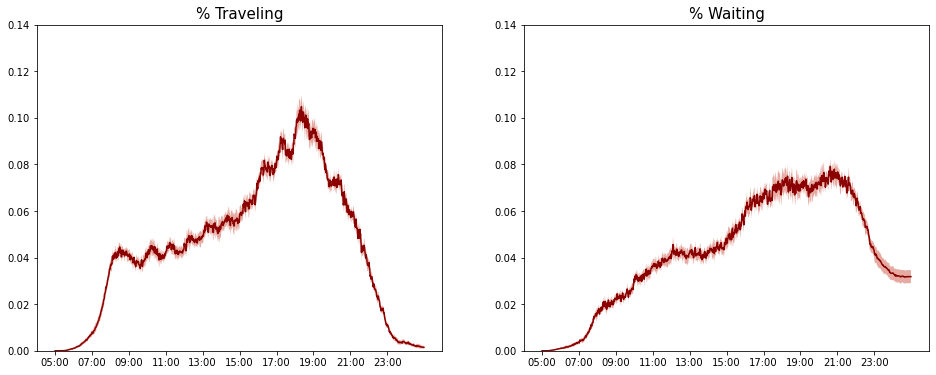

In [39]:
# aggregated time series waiting and traveling ag PRE
ka.agg_moving_ts_plot(moving_agents_pre_ex1)

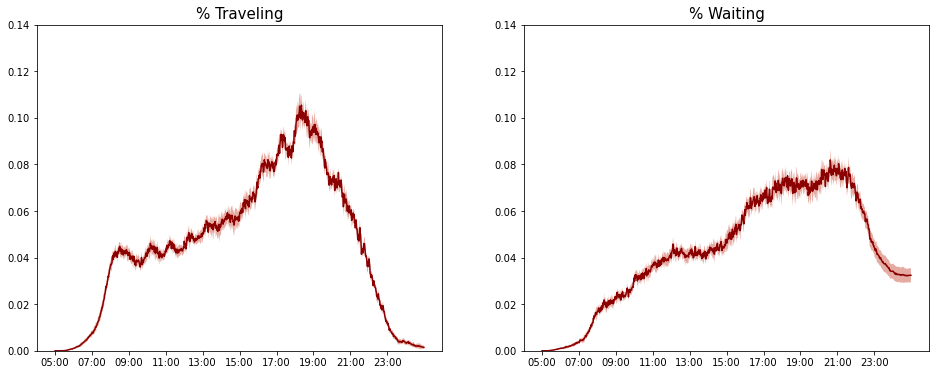

In [40]:
# aggregated time series waiting and traveling ag POST
ka.agg_moving_ts_plot(moving_agents_post_ex1)

As it can be observed from the previously shown outputs, the removal of the Duomo stop does not seem to affect the waiting and traveling times overall. However, when considering only the subset of agents that either have to carry activities or change vehicles at Duomo, it can be appreciated that the intervention indeed leads to a slight increase in total time spent waiting or traveling.

In [32]:
# return aggregate measure for the full_edges function across simulations PRE
"""
Returns a df sorted by total number of minutes each edge reached full capacity.
"""

full_edges_agg_pre = [ka.full_edges_df(dict_).rename(columns ={"Full Minutes": i}) for i,dict_ in enumerate(full_edges_pre_ex1)]
full_edges_agg_pre = reduce(lambda left,right: pd.merge(left, right, left_index = True, right_index = True, how = "outer"), full_edges_agg_pre).fillna(0)
mean_ = full_edges_agg_pre.mean(axis=1)
std_ = full_edges_agg_pre.std(axis=1)
min_ = full_edges_agg_pre.min(axis=1)
max_ = full_edges_agg_pre.max(axis=1)
median_ = full_edges_agg_pre.quantile(axis=1)
full_edges_agg_pre["mean"] = mean_
full_edges_agg_pre["std"] = std_
full_edges_agg_pre["min"] = min_
full_edges_agg_pre["max"] = max_
full_edges_agg_pre["median"] = median_
full_edges_agg_pre = full_edges_agg_pre[["mean", "std", "min", "max", "median"]].sort_values("mean", ascending = False)

In [33]:
# return aggregate measure for the full_edges function across simulations POST
"""
Returns a df sorted by total number of minutes each edge reached full capacity.
"""

full_edges_agg_post = [ka.full_edges_df(dict_).rename(columns ={"Full Minutes": i}) for i,dict_ in enumerate(full_edges_post_ex1)]
full_edges_agg_post = reduce(lambda left,right: pd.merge(left, right, left_index = True, right_index = True, how = "outer"), full_edges_agg_post).fillna(0)
mean_ = full_edges_agg_post.mean(axis=1)
std_ = full_edges_agg_post.std(axis=1)
min_ = full_edges_agg_post.min(axis=1)
max_ = full_edges_agg_post.max(axis=1)
median_ = full_edges_agg_post.quantile(axis=1)
full_edges_agg_post["mean"] = mean_
full_edges_agg_post["std"] = std_
full_edges_agg_post["min"] = min_
full_edges_agg_post["max"] = max_
full_edges_agg_post["median"] = median_
full_edges_agg_post = full_edges_agg_post[["mean", "std", "min", "max", "median"]].sort_values("mean", ascending = False)

In [34]:
# show the differences in number of passengers (vehicle usage) pre vs post experiment
full_edges_agg_diff = pd.merge(full_edges_agg_post[["mean"]].rename(columns = {"mean": "mean_post"}),
                                      full_edges_agg_pre[["mean"]].rename(columns = {"mean": "mean_pre"}),
                                      left_index = True, right_index = True, how = "outer")
full_edges_agg_diff["diff"] = full_edges_agg_diff["mean_post"] -  full_edges_agg_diff["mean_pre"]
full_edges_agg_diff["% change"] = (full_edges_agg_diff["mean_post"] -  full_edges_agg_diff["mean_pre"])/ full_edges_agg_diff["mean_pre"]
full_edges_agg_diff["% change"] = full_edges_agg_diff["% change"].apply(lambda x: round(x*100,1))
top_10_full = full_edges_agg_diff.sort_values(by = '% change', ascending = False).head(10)
bottom_10_full = full_edges_agg_diff.sort_values(by = '% change', ascending = True).head(10)

In [36]:
ka.display_side_by_side(top_10_full,bottom_10_full)

,mean_post,mean_pre,diff,% change
"(12587, 15079, BUS81)",2.0,0.5,1.5,300.0
"(12173, 15635, BUS60)",0.8,0.2,0.6,300.0
"(11801, 11809, BUS61)",5.1,1.3,3.8,292.3
"(10552, 18075, BUS98)",0.7,0.2,0.5,250.0
"(11048, 11045, BUS40)",0.3,0.1,0.2,200.0
"(11889, 11893, BUS60)",0.3,0.1,0.2,200.0
"(17702, 16939, FILOBUS92)",0.3,0.1,0.2,200.0
"(15363, 10786, BUS74)",0.3,0.1,0.2,200.0
"(17820, 12706, BUS924)",2.7,0.9,1.8,200.0
"(11155, 11157, BUS59)",0.6,0.2,0.4,200.0


In [43]:
import matplotlib
import matplotlib.patches as mpatches
def plot_lines_graph(G, coords,single_lines = [], lines_group1 = [], lines_group2 = [], edges = [], figsize = (20,20), dpi = 500):
    """
    Plots the newtork with only edges belonging to the specified lines. All lines in 'single_lines' are
    plotted with a different colors. Lines in 'lines_group1' are all plotted in 'mediumspringgreen' and lines
    in 'lines_grou2' are all plotted in' deeppink'
    """
    colors_metro = {'METRO1': 'red', 'METRO2': 'green', 'METRO3': 'yellow', 'METRO4': 'blue', 'METRO5': 'violet'}
    colors_dict = {}
    cmap = matplotlib.cm.get_cmap('Set2')
    plt.figure(figsize=figsize, dpi=dpi)
                 
    # colors for single lines
    if single_lines != []:
        i = 0.1
        for l in single_lines:
            if l in colors_metro:
                colors_dict[l] = colors_metro[l]
            else:
                rgba = cmap(i)
                colors_dict[l] = rgba
                i += 0.1
    # color for group one
    if lines_group1 != []:
        col1 = 'mediumspringgreen'
        for l in lines_group1:
            colors_dict[l] = col1
    
    # colors for group two
    if lines_group2 != []:
        col2 = 'deeppink'
        for l in lines_group2:
            colors_dict[l] = col2
           
    G_sub = nx.MultiDiGraph() # create sub graph
    G_sub.add_nodes_from(list(G.nodes)) # add all nodes
    
    all_lines = set(single_lines).union(set(lines_group1)).union(set(lines_group2))
    
    for edge in G.edges: # loop over all edges of original graph
        if edge[2] in set(all_lines): # only select the ones with the relevant lines
            G_sub.add_edge(edge[0], edge[1], edge[2], color = colors_dict[edge[2]]) # add them to the sub graphs
            
        if edge in set(edges):
            G_sub.add_edge(edge[0], edge[1], edge[2], color = 'grey')
            plt.text(coords[edge[0]][0], coords[edge[0]][1], f'{edge[2]}')
            
    
    colors = [G_sub[u][v][l]['color'] for u,v,l in G_sub.edges] # get colors
    nx.draw_networkx(G_sub, pos = coords, with_labels=False, node_size=1,edge_color=colors, arrowsize = 3,
                    node_color = 'gainsboro', width = 3, label = colors_dict) # plot graph
    
    # build legend
    leg = defaultdict(list)
    for l in all_lines:
        leg[colors_dict[l]].append(l)
        
    legend_handles = []
    for k, v in leg.items():
        legend_handles.append(mpatches.Patch(color=k, label= ', '.join(v)))
        
    plt.legend(handles=legend_handles)

In [46]:
# visualizing edges reaching full capacity most often after intervention
plot_lines_graph(G, ka.coords, single_lines = ["METRO1", "METRO3"], edges = list(top_10_full.index))

In [45]:
# visualizing edges reaching full capacity least often after intervention
plot_lines_graph(G, ka.coords, single_lines = ["METRO1", "METRO3"], edges = list(bottom_10_full.index))

In [47]:
# returns vehicle_changes across simulations PRE on all agents
"""
Computing the average number of vehicle changes for a given list of agent objects.
"""

agg_vehicle_changes_pre = []

for agent_list in agents_list_pre_ex1:
    mean = ka.vehicle_changes(agent_list) 
    agg_vehicle_changes_pre.append(mean)
    
agg_mean_vehicle_changes_pre = np.mean(agg_vehicle_changes_pre)
agg_std_vehicle_changes_pre = np.std(agg_vehicle_changes_pre)

In [48]:
# returns vehicle_changes across simulations POST on all agents
"""
Computing the average number of vehicle changes for a given list of agent objects.
"""

agg_vehicle_changes_post = []

for agent_list in agents_list_post_ex1:
    mean = ka.vehicle_changes(agent_list) 
    agg_vehicle_changes_post.append(mean)
    
agg_mean_vehicle_changes_post = np.mean(agg_vehicle_changes_post)
agg_std_vehicle_changes_post = np.std(agg_vehicle_changes_post)

In [50]:
# returns vehicle_changes across simulations PRE on affected agents
"""
Computing the average number of vehicle changes for a given list of agent objects.
"""

agg_vehicle_changes_pre_int = []

for agent_list in agents_list_pre_ex1_int:
    mean = ka.vehicle_changes(agent_list) 
    agg_vehicle_changes_pre_int.append(mean)
    
agg_mean_vehicle_changes_pre_int = np.mean(agg_vehicle_changes_pre_int)
agg_std_vehicle_changes_pre_int = np.std(agg_vehicle_changes_pre_int)

In [51]:
# returns vehicle_changes across simulations POST on affected agents
"""
Computing the average number of vehicle changes for a given list of agent objects.
"""

agg_vehicle_changes_post_int = []

for agent_list in agents_list_post_ex1_int:
    mean = ka.vehicle_changes(agent_list) 
    agg_vehicle_changes_post_int.append(mean)
    
agg_mean_vehicle_changes_post_int = np.mean(agg_vehicle_changes_post_int)
agg_std_vehicle_changes_post_int = np.std(agg_vehicle_changes_post_int)

In [52]:
print("Considering all the agents:")
print()
print("Mean Number of Vehicle Changes:\n- Pre-Experiment:",agg_mean_vehicle_changes_pre,'- Standard deviation:',agg_std_vehicle_changes_pre)
print("- Pre-Experiment:",agg_mean_vehicle_changes_post,'- Standard deviation:',agg_std_vehicle_changes_post)
print()
print("Considering affected agents:")
print()
print("Mean Number of Vehicle Changes:\n- Pre-Experiment:",agg_mean_vehicle_changes_pre_int,'- Standard deviation:',agg_std_vehicle_changes_pre_int)
print("- Post-Experiment:",agg_mean_vehicle_changes_post_int,'- Standard deviation:',agg_std_vehicle_changes_post_int)

Considering all the agents:

Mean Number of Vehicle Changes:
- Pre-Experiment: 8.056826978444413 - Standard deviation: 0.031306795625970614
- Pre-Experiment: 8.267680332398852 - Standard deviation: 0.02977694771108466

Considering affected agents:

Mean Number of Vehicle Changes:
- Pre-Experiment: 9.407674639523945 - Standard deviation: 0.10250129108162273
- Post-Experiment: 10.61109837782793 - Standard deviation: 0.0938084902984964


Again, we can observe an impact on the considered subset of agents: they have to change vehicle one additional time on average throughout their day.

In [53]:
# returns foot_route across simulations PRE on all agents
"""
Returns average number of times agents move on foot.
"""

agg_foot_route_pre = []

for agent_list in agents_list_pre_ex1:
    mean = ka.foot_route(agent_list)
    agg_foot_route_pre.append(mean)
    
agg_mean_foot_route_pre = np.mean(agg_foot_route_pre)
agg_std_agg_foot_route_pre = np.std(agg_foot_route_pre)

In [54]:
# returns foot_route across simulations POST on all agents
"""
Returns average number of times agents move on foot.
"""

agg_foot_route_post = []

for agent_list in agents_list_post_ex1:
    mean = ka.foot_route(agent_list)
    agg_foot_route_post.append(mean)
    
agg_mean_foot_route_post = np.mean(agg_foot_route_post)
agg_std_agg_foot_route_post = np.std(agg_foot_route_post)

In [55]:
# returns foot_route across simulations POST on affected agents
"""
Returns average number of times agents move on foot.
"""

agg_foot_route_post_int = []

for agent_list in agents_list_post_ex1_int:
    mean = ka.foot_route(agent_list)
    agg_foot_route_post_int.append(mean)
    
agg_mean_foot_route_post_int = np.mean(agg_foot_route_post_int)
agg_std_agg_foot_route_post_int = np.std(agg_foot_route_post_int)

In [56]:
# returns foot_route across simulations PRE on affected agents
"""
Returns average number of times agents move on foot.
"""

agg_foot_route_pre_int = []

for agent_list in agents_list_pre_ex1_int:
    mean = ka.foot_route(agent_list)
    agg_foot_route_pre_int.append(mean)
    
agg_mean_foot_route_pre_int = np.mean(agg_foot_route_pre_int)
agg_std_agg_foot_route_pre_int = np.std(agg_foot_route_pre_int)

In [57]:
print("Considering all the agents:")
print()
print("Mean Number of times agents need to move on foot:\n- Pre-Experiment:",agg_mean_foot_route_pre,'- Standard deviation:',agg_std_agg_foot_route_pre)
print("- Post-Experiment:",agg_mean_foot_route_post,'- Standard deviation:',agg_std_agg_foot_route_post)
print()
print("Considering affected agents:")
print()
print("Mean Number of times agents need to move on foot:\n- Post-Experiment:",agg_mean_foot_route_pre_int,'- Standard deviation:',agg_std_agg_foot_route_pre)
print("- Post-Experiment:",agg_mean_foot_route_post_int,'- Standard deviation:',agg_std_agg_foot_route_post_int)

Considering all the agents:

Mean Number of times agents need to move on foot:
- Pre-Experiment: 6.413595376513188 - Standard deviation: 0.02393877159756704
- Post-Experiment: 6.52395984526097 - Standard deviation: 0.0248869975101241

Considering affected agents:

Mean Number of times agents need to move on foot:
- Post-Experiment: 8.056095352572147 - Standard deviation: 0.02393877159756704
- Post-Experiment: 8.688910045021828 - Standard deviation: 0.08187052597241547


In [58]:
# vehicle usage across simulations and all agents PRE
"""
Returns total number of passengers for each vehicle.
"""

vehicle_usage_agg = [ka.vehicle_usage(agent_list).rename(columns = {"Total Passengers": i}) for i,agent_list in enumerate(agents_list_pre_ex1)]
vehicle_usage_agg = reduce(lambda left,right: pd.merge(left, right, left_index = True, right_index = True, how = "outer"), vehicle_usage_agg).fillna(0)
mean_ = vehicle_usage_agg.mean(axis=1)
std_= vehicle_usage_agg.std(axis=1)
min_ = vehicle_usage_agg.min(axis=1)
max_ = vehicle_usage_agg.max(axis=1)
median_ = vehicle_usage_agg.quantile(axis=1)
vehicle_usage_agg["mean"] = mean_
vehicle_usage_agg["std"] = std_
vehicle_usage_agg["min"] = min_
vehicle_usage_agg["max"] = max_
vehicle_usage_agg["median"] = median_
vehicle_usage_agg = vehicle_usage_agg[["mean", "std", "min", "max", "median"]].sort_values("mean", ascending = False)

In [59]:
# vehicle usage across simulations and all agents POST
# agents_list_post_ex1
                                                                                                                                
vehicle_usage_agg_post = [ka.vehicle_usage(agent_list).rename(columns = {"Total Passengers": i}) for i,agent_list in enumerate(agents_list_post_ex1)]
vehicle_usage_agg_post = reduce(lambda left,right: pd.merge(left, right, left_index = True, right_index = True, how = "outer"), vehicle_usage_agg_post).fillna(0)
mean_ = vehicle_usage_agg_post.mean(axis=1)
std_= vehicle_usage_agg_post.std(axis=1)
min_ = vehicle_usage_agg_post.min(axis=1)
max_ = vehicle_usage_agg_post.max(axis=1)
median_ = vehicle_usage_agg_post.quantile(axis=1)
vehicle_usage_agg_post["mean"] = mean_
vehicle_usage_agg_post["std"] = std_
vehicle_usage_agg_post["min"] = min_
vehicle_usage_agg_post["max"] = max_
vehicle_usage_agg_post["median"] = median_
vehicle_usage_agg_post = vehicle_usage_agg_post[["mean", "std", "min", "max", "median"]].sort_values("mean", ascending = False)

In [60]:
# show the differences in number of passengers (vehicle usage) pre vs post experiment
vehicle_usage_agg_diff = pd.merge(vehicle_usage_agg_post[["mean"]].rename(columns = {"mean": "mean_post"}),
                                      vehicle_usage_agg[["mean"]].rename(columns = {"mean": "mean_pre"}), ##
                                      left_index = True, right_index = True, how = "outer")
vehicle_usage_agg_diff["diff"] = vehicle_usage_agg_diff["mean_post"] -  vehicle_usage_agg_diff["mean_pre"]
vehicle_usage_agg_diff["% change"] = (vehicle_usage_agg_diff["mean_post"] -  vehicle_usage_agg_diff["mean_pre"])/ vehicle_usage_agg_diff["mean_pre"]
vehicle_usage_agg_diff["% change"] = vehicle_usage_agg_diff["% change"].apply(lambda x: round(x*100,1))

In [66]:
import matplotlib

In [62]:
top_5 = vehicle_usage_agg_diff.sort_values("% change", ascending = False).head()
bottom_5 = vehicle_usage_agg_diff.sort_values("% change", ascending = True).head()
ka.display_side_by_side(top_5, bottom_5)

,mean_post,mean_pre,diff,% change
TRAM16,5335.7,1590.5,3745.2,235.5
TRAM12,3602.8,2941.3,661.5,22.5
TRAM19,4087.6,3410.1,677.5,19.9
TRAM27,2792.8,2479.3,313.5,12.6
BUS94,5537.7,4932.1,605.6,12.3
,mean_post,mean_pre,diff,% change
METRO3,48421.9,54810.5,-6388.6,-11.7
BUS926,26.1,28.9,-2.8,-9.7
METRO1,86495.4,94379.0,-7883.6,-8.4
TRAM2,1735.5,1874.4,-138.9,-7.4


In [80]:
plot_lines_graph(G_ex1, ka.coords, single_lines=["METRO3", "METRO1"], lines_group1 =list(top_5.index))
plt.scatter(ka.coords[959][0], ka.coords[959][1], s = 30, c = "k")
plt.scatter(ka.coords[960][0], ka.coords[960][1], s = 30, c = "k")
plt.text(ka.coords[960][0], ka.coords[960][1], "Duomo")
plt.show()

The plot above shows the vehicles experiencing the most sizeable change in average number of passengers. More specifically, METRO1 and METRO3, directly affected by the intervention, undergo the most significant decrease, and although the change is not excessive in relative terms, the absolute number is in the order of thousands of agents. On the other hand, alternatives to METRO1 and 3 to reach the Duomo stops experience an appreciable spike in the average number of passengers.

In [81]:
# hotspots across different simulations pre exp
                                                                                               
n_hotspots_pre_agg = [ka.n_hotspots(20,df)[["id_amat","daily_waiters"]].rename(columns ={"daily_waiters": i}) for i, df in enumerate(daily_waiters_pre_ex1)]
n_hotspots_pre_agg = reduce(lambda left,right: pd.merge(left, right, left_on = "id_amat", right_on = "id_amat", how = "outer"), n_hotspots_pre_agg).fillna(0)
                                                       
mean_ = n_hotspots_pre_agg.loc[:,[i for i in range(len(daily_waiters_pre_ex1))]].mean(axis = 1)
n_hotspots_pre_agg["mean"] = mean_
n_hotspots_pre_agg = n_hotspots_pre_agg[["id_amat","mean"]].sort_values("mean", ascending = False).rename(columns= {"nome_x": "name"})
n_hotspots_pre_agg = pd.merge(n_hotspots_pre_agg, ka.fermate).rename(columns ={"nome": "name"})[["id_amat", "name","mean"]]

In [82]:
# hotspots across different simulations post exp
                                                                                               
n_hotspots_post_agg = [ka.n_hotspots(20,df)[["id_amat","daily_waiters"]].rename(columns ={"daily_waiters": i}) for i, df in enumerate(daily_waiters_post_ex1)]
n_hotspots_post_agg = reduce(lambda left,right: pd.merge(left, right, left_on = "id_amat", right_on = "id_amat", how = "outer"), n_hotspots_post_agg).fillna(0)
                                                       
mean_ = n_hotspots_post_agg.loc[:,[i for i in range(len(daily_waiters_post_ex1))]].mean(axis = 1)
n_hotspots_post_agg["mean"] = mean_
n_hotspots_post_agg = n_hotspots_post_agg[["id_amat","mean"]].sort_values("mean", ascending = False).rename(columns= {"nome_x": "name"})
n_hotspots_post_agg = pd.merge(n_hotspots_post_agg, ka.fermate).rename(columns ={"nome": "name"})[["id_amat", "name","mean"]]

In [84]:
ka.display_side_by_side(n_hotspots_pre_agg.head(15), n_hotspots_post_agg.head(15))

,id_amat,name,mean
0,985,CADORNA FN M1,5859.4
1,956,GARIBALDI FS,5801.8
2,984,CADORNA FN M2,5625.7
3,975,CENTRALE FS,4562.1
4,890,ZARA,4161.1
5,959,DUOMO M3,3869.2
6,960,DUOMO M1,3443.3
7,930,PAGANO,2519.9
8,990,BISCEGLIE,1887.1
9,937,MACIACHINI,1793.0


The table above is showing that pre-intervention Duomo stops are among the most trafficked nodes. After the intervention, although the schedules of the agents remain the same, the nodes are not present in the top 15, implying that they represent key linking points. This is furtherly proven by the fact that duomo stops appear among the highest ranking nodes in terms of betweenness centrality.

In [99]:
bw = nx.betweenness_centrality(G)

In [108]:
# duomo stops ids = 959, 960
bw_df = pd.DataFrame([bw]).T.sort_values(0, ascending = False).rename(columns = {0: "Betwenness Centrality"})
bw_df.head(15)

,Betwenness Centrality
956,0.257253
975,0.216899
890,0.212804
930,0.211111
984,0.207614
968,0.195543
985,0.193322
944,0.177657
931,0.174675
939,0.158502


In [85]:
# hotedges across different simulations pre exp
                                                                                              
n_hotedges_pre_agg = [ka.n_hotedges(20, df).rename(columns ={"daily_passengers": i}) for i, df in enumerate(daily_passengers_pre_ex1)]


for i, df in enumerate(n_hotedges_pre_agg):
    df["edge"] = df.apply(lambda x: f"{x['from']} {x['to']} {x['line']}", axis = 1)
    n_hotedges_pre_agg[i] = df[[i, "edge"]]

n_hotedges_pre_agg = reduce(lambda left,right: pd.merge(left, right, left_on = "edge", right_on = "edge", how = "outer"), n_hotedges_pre_agg).fillna(0)

mean_ = n_hotedges_pre_agg.loc[:,[i for i in range(len(daily_passengers_pre_ex1))]].mean(axis = 1)
n_hotedges_pre_agg["mean"] = mean_
n_hotedges_pre_agg = n_hotedges_pre_agg[["edge","mean"]]
n_hotedges_pre_agg["from"] = n_hotedges_pre_agg["edge"].apply(lambda x: int(x.split(" ")[0]))
n_hotedges_pre_agg["to"] = n_hotedges_pre_agg["edge"].apply(lambda x: int(x.split(" ")[1]))
n_hotedges_pre_agg["line"] = n_hotedges_pre_agg["edge"].apply(lambda x: x.split(" ")[2])
n_hotedges_pre_agg = pd.merge(n_hotedges_pre_agg, ka.fermate, left_on = "from", right_on = "id_amat")[['edge','nome','to','mean']].rename(columns = {'nome':'from'})
n_hotedges_pre_agg = pd.merge(n_hotedges_pre_agg, ka.fermate, left_on = "to", right_on = "id_amat")[['edge','from','nome','mean']].rename(columns = {'nome':'to'})

In [86]:
# hotedges across different simulations post exp
                                                                                              
n_hotedges_post_agg = [ka.n_hotedges(20, df).rename(columns ={"daily_passengers": i}) for i, df in enumerate(daily_passengers_post_ex1)]


for i, df in enumerate(n_hotedges_post_agg):
    df["edge"] = df.apply(lambda x: f"{x['from']} {x['to']} {x['line']}", axis = 1)
    n_hotedges_post_agg[i] = df[[i, "edge"]]

n_hotedges_post_agg = reduce(lambda left,right: pd.merge(left, right, left_on = "edge", right_on = "edge", how = "outer"), n_hotedges_post_agg).fillna(0)

mean_ = n_hotedges_post_agg.loc[:,[i for i in range(len(daily_passengers_post_ex1))]].mean(axis = 1)
n_hotedges_post_agg["mean"] = mean_
n_hotedges_post_agg = n_hotedges_post_agg[["edge","mean"]]
n_hotedges_post_agg["from"] = n_hotedges_post_agg["edge"].apply(lambda x: int(x.split(" ")[0]))
n_hotedges_post_agg["to"] = n_hotedges_post_agg["edge"].apply(lambda x: int(x.split(" ")[1]))
n_hotedges_post_agg["line"] = n_hotedges_post_agg["edge"].apply(lambda x: x.split(" ")[2])
n_hotedges_post_agg = pd.merge(n_hotedges_post_agg, ka.fermate, left_on = "from", right_on = "id_amat")[['edge','nome','to','mean']].rename(columns = {'nome':'from'})
n_hotedges_post_agg = pd.merge(n_hotedges_post_agg, ka.fermate, left_on = "to", right_on = "id_amat")[['edge','from','nome','mean']].rename(columns = {'nome':'to'})

In [88]:
ka.display_side_by_side(n_hotedges_pre_agg.head(10), n_hotedges_post_agg.head(10))

,edge,from,to,mean
0,968 985 METRO1,CONCILIAZIONE,CADORNA FN M1,3651.0
1,981 985 METRO1,CAIROLI,CADORNA FN M1,3060.4
2,968 930 METRO1,CONCILIAZIONE,PAGANO,3143.6
3,981 967 METRO1,CAIROLI,CORDUSIO,3187.6
4,960 967 METRO1,DUOMO M1,CORDUSIO,2968.6
5,985 968 METRO1,CADORNA FN M1,CONCILIAZIONE,3518.9
6,930 968 METRO1,PAGANO,CONCILIAZIONE,3342.8
7,985 981 METRO1,CADORNA FN M1,CAIROLI,3138.3
8,967 981 METRO1,CORDUSIO,CAIROLI,3151.7
9,967 960 METRO1,CORDUSIO,DUOMO M1,2933.1


In [90]:
# distance-adjusted times across different simulations PRE exp

time_distribution_pre_ex1 = []

for history_ in history_pre_ex1:
    time_distribution_pre_ex1 = np.concatenate([time_distribution_pre_ex1, ka.time_distance_distribution(history_, G)[0]])
    
# distance-adjusted times across different simulations POST exp

time_distribution_post_ex1 = []

for history_ in history_post_ex1:
    time_distribution_post_ex1 = np.concatenate([time_distribution_post_ex1, ka.time_distance_distribution(history_, G_ex1)[0]])
    

In [91]:
# distance-adjusted times across different simulations POST exp

time_distribution_post_ex1 = []

for history_ in history_post_ex1:
    time_distribution_post_ex1 = np.concatenate([time_distribution_post_ex1, ka.time_distance_distribution(history_, G_ex1)[0]])
    

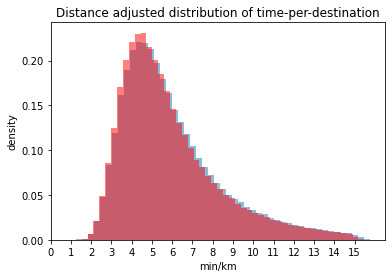

In [97]:
plt.hist(time_distribution_post_ex1, bins = 50, density = True, alpha = 0.5)
plt.hist(time_distribution_pre_ex1, bins = 50, density = True, alpha = 0.5, color = 'red')
plt.xticks([i for i in range(int(max(time_distribution_post_ex1)+1))])
plt.xlabel('min/km')
plt.ylabel('density')
plt.title('Distance adjusted distribution of time-per-destination')
plt.show()